# EveryBeam LOFAR LBA LOBES


<div class="alert alert-block alert-info">
⚠️ This whole notebook basically says JLBLine can't make LOBES work so we shouldn't use it for now. If we need it in the future, feel free to use this notebook as a starting point to figure it out. ⚠️
</div>

See `test_installation/everybeam/test_LOFAR_LBA_hamaker.ipynb` for a more general overview of the LOFAR LBA beam model in `WODEN`. Here, we focus on comparing the `LOBES` and `Hamaker` models. `LOBES` is a more involved model that takes mutual coupling into account (?? - I cannot find ANY references for LOBES in the literature).

Note that in the below, I will be using the inbuilt `EveryBeam` python wrapper. I'm doing this to ensure I haven't introduced any errors via any `WODEN` wrapper functions.

When you install `EveryBeam` you need to add `-DDOWNLOAD_LOBES=ON` to the `cmake` command line to get the LOBES model downloaded and built. The coefficients for a number of stations will be downloaded:

```
LOBES_CS001LBA.h5  LOBES_CS011LBA.h5  LOBES_CS030LBA.h5  LOBES_CS302LBA.h5  LOBES_DE605LBA.h5  LOBES_PL612LBA.h5  LOBES_RS307LBA.h5  LOBES_RS509LBA.h5
LOBES_CS002LBA.h5  LOBES_CS013LBA.h5  LOBES_CS031LBA.h5  LOBES_CS401LBA.h5  LOBES_DE609LBA.h5  LOBES_RS106LBA.h5  LOBES_RS310LBA.h5  LOBES_SE607LBA.h5
LOBES_CS003LBA.h5  LOBES_CS017LBA.h5  LOBES_CS032LBA.h5  LOBES_CS501LBA.h5  LOBES_FR606LBA.h5  LOBES_RS205LBA.h5  LOBES_RS406LBA.h5  LOBES_UK608LBA.h5
LOBES_CS004LBA.h5  LOBES_CS021LBA.h5  LOBES_CS101LBA.h5  LOBES_DE601LBA.h5  LOBES_IE613LBA.h5  LOBES_RS208LBA.h5  LOBES_RS407LBA.h5
LOBES_CS005LBA.h5  LOBES_CS024LBA.h5  LOBES_CS103LBA.h5  LOBES_DE602LBA.h5  LOBES_LV614LBA.h5  LOBES_RS210LBA.h5  LOBES_RS409LBA.h5
LOBES_CS006LBA.h5  LOBES_CS026LBA.h5  LOBES_CS201LBA.h5  LOBES_DE603LBA.h5  LOBES_PL610LBA.h5  LOBES_RS305LBA.h5  LOBES_RS503LBA.h5
LOBES_CS007LBA.h5  LOBES_CS028LBA.h5  LOBES_CS301LBA.h5  LOBES_DE604LBA.h5  LOBES_PL611LBA.h5  LOBES_RS306LBA.h5  LOBES_RS508LBA.h5
```

Note that combined the coefficients are 12 GB of data, so it takes a while to download. This is essentially a list of all available station models. This means anything not on this list will default to the `Hamaker` model in `EveryBeam`. This has consequences for running a full `LOFAR` simulation as we'll see later.

## Basic LOBEs properties

Once installed, they are installed in `you/install/path/share/everybeam/lobes/`. We can take a look at the header to get a feel for the contents:


In [1]:
import h5py
from pathlib import Path

##CHANGE THIS to whatever parents installation you have on your machine
your_install_dir = Path('/home/jack-line/software/install')

lobes_loc = Path(your_install_dir, 'share/everybeam/lobes/LOBES_CS002LBA.h5')

print(lobes_loc)

with h5py.File(lobes_loc, 'r') as f:
    key_list = list(f.keys())
    print(key_list)

/home/jack-line/software/install/share/everybeam/lobes/LOBES_CS002LBA.h5
['coefficients', 'frequencies', 'nms']


So basically just a bunch of coefficients at a list of freuencies. From inspection of the `everybeam` codebase, I think things are fit in spherical harmonics. Let's look at some basic properties:

In [2]:
with h5py.File(lobes_loc, 'r') as f:
    freqs = f['frequencies']
    print(freqs.shape)

# print("Number freqs:", len(freqs))

(81,)


Always good to see how big an array is before loading in, and `h5py` is smart enough to no load anything until you ask for it. 81 freqs is small enough, so let's load them in a see the frequencies:

In [3]:
with h5py.File(lobes_loc, 'r') as f:
    freqs = f['frequencies'][:]
    print("Min, Max (MHz)", freqs.min()/1e+6, freqs.max()/1e+6)
    print("Reso: ", (freqs[1]-freqs[0])/1e+6)

Min, Max (MHz) 10.0 90.0
Reso:  1.0


Righto, so the model goes from 10-90 MHz in 1 MHz steps. 

In [4]:
with h5py.File(lobes_loc, 'r') as f:
    coeffs = f['coefficients']
    print("Coeffs shape:", coeffs.shape)

Coeffs shape: (2, 81, 96, 966)


I'm going to guess that means 2 dipole orientations, 81 frequencies, 96 dipoles for this station, and 966 spherical harmonic coefficients. So should be able to model plenty of structure of the sky; also means a decent amount of computation.

## Hamaker vs LOBES beam on the sky
We'll start by just plotting a single dipole on the sky, for both the `Hamaker` and `LOBES` models, to see how they compare. I'm going to do this first of all using the `EveryBeam` python interface, just to eliminate any possible rotation/input issues from the `WODEN` wrappers. First of all, set up a bunch of observational parameters, and point a measurement set to a given RA/Dec:

In [5]:
import numpy as np
from astropy.coordinates import SkyCoord
from astropy.coordinates import EarthLocation
from astropy.time import Time
from astropy import units as u
from wodenpy.primary_beam.use_everybeam import create_filtered_ms

ra0 = 0
dec0 = 53

lofar_lat = 52.905329712
lofar_long = 6.867996528

##pick a time/date that sticks our phase centre overhead
date = "2024-07-21T03:35:00"
##Assume that the OSKAR telescope is near the MWA??
lofar_location = EarthLocation(lat=lofar_lat*u.deg, 
                               lon=lofar_long*u.deg)

observing_time = Time(date, scale='utc', location=lofar_location)

##Grab the LST
LST = observing_time.sidereal_time('mean')
LST_deg = LST.value*15
print(f"LST: {LST_deg} deg, RA: {ra0}")


create_filtered_ms("lba.MS", "pointed_LBA.ms", np.radians(ra0), np.radians(dec0))

ms_path = "pointed_LBA.ms"

LST: 0.01862197128531748 deg, RA: 0
Successful readonly open of default-locked table lba.MS: 24 columns, 4218 rows
Successful read/write open of default-locked table pointed_LBA.ms::FIELD: 10 columns, 1 rows


We'll borrow the ra,dec conversion code from [`EveryBeam` examples ](https://everybeam.readthedocs.io/en/latest/tree/demos/lofar-array-factor.html), and convert a grid of RA/Dec. We're not gonna worry about precessing RA/Dec from J2000 to current coords here as we're not doing a full accurate simulation, just looking at the beam shapes.

In [6]:
from astropy.coordinates import ITRS

def radec_to_xyz(ra, dec, time):
    """
    Convert RA and Dec ICRS coordinates to ITRS cartesian coordinates.

    Args:
        ra (astropy.coordinates.Angle): Right ascension
        dec (astropy.coordinates.Angle): Declination
        time (float): MJD time in seconds

    Returns:
        pointing_xyz (ndarray): NumPy array containing the ITRS X, Y and Z coordinates
    """
    obstime = Time(time/3600/24, scale='utc', format='mjd')
    dir_pointing = SkyCoord(ra, dec)
    dir_pointing_itrs = dir_pointing.transform_to(ITRS(obstime=obstime))
    return np.asarray(dir_pointing_itrs.cartesian.xyz.transpose())

In [7]:
from eb_testing_code import create_WCS

##setup coords
nside = 100
radec_reso = 60 / nside
header, wcs = create_WCS(ra0, dec0, nside, radec_reso)
x_mesh, y_mesh = np.meshgrid(np.arange(nside), np.arange(nside))
ras, decs = wcs.all_pix2world(x_mesh, y_mesh, 0)
ras = np.radians(ras.flatten())
decs = np.radians(decs.flatten())


mjd_time_seconds = observing_time.mjd*3600*24

itrs_xyz = radec_to_xyz(ras*u.rad, decs*u.rad, mjd_time_seconds)
print(itrs_xyz.shape)

(10000, 3)


OK, now we'll make an EveryBeam telescope object. Now, I don't like installing `EveryBeam` into my system path, so I'm going to point this code at my local install here. If you want to replicate things, change the paths below to point at your own `EveryBeam` install location.

In [8]:
from sys import path
path.append("/home/jack-line/software/install/lib/python3.12/site-packages")

import everybeam as eb

response_model = 'hamaker'
hamaker_telescope = eb.load_telescope(ms_path, element_response_model=response_model)

In [9]:
station_id = 0 #first available station
element_id = 0 #first available dipole
frequency = 60e+6
direction = itrs_xyz
is_local = False ##boolean for "local" coords, so I think this means topocentric rather than ITRS if True
rotate = False ##parallactic rotation of the dipoles


hamaker_jones = np.zeros((itrs_xyz.shape[0], 2, 2), dtype=np.complex64)

for xyz_idx in range(itrs_xyz.shape[0]):
    hamaker_jones[xyz_idx, :, :] = hamaker_telescope.element_response(
                                mjd_time_seconds,
                                station_id,
                                element_id,
                                frequency,
                                direction[xyz_idx, :],
                                is_local,
                                rotate=rotate,
                            )

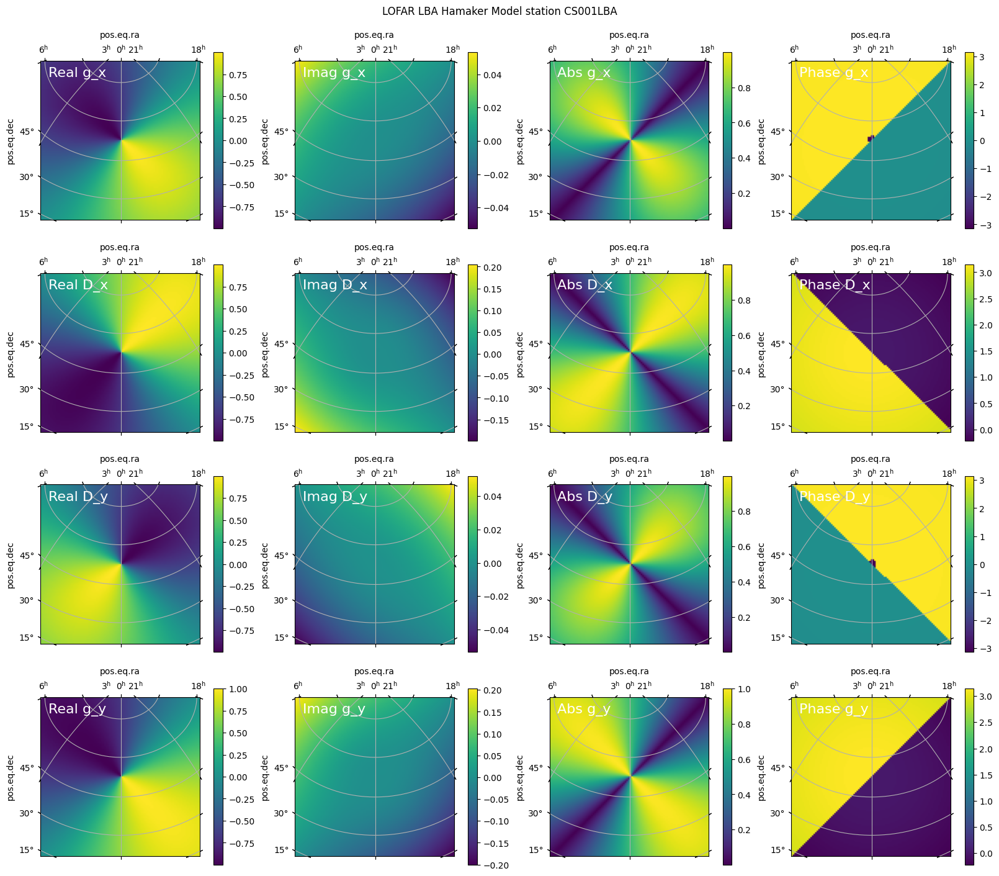

In [10]:

from eb_testing_code import plot_jones_on_sky

hamaker_gx = hamaker_jones[:, 0, 0]
hamaker_Dx = hamaker_jones[:, 0, 1]
hamaker_Dy = hamaker_jones[:, 1, 0]
hamaker_gy = hamaker_jones[:, 1, 1]

hamaker_gx.shape = (nside, nside)
hamaker_Dx.shape = (nside, nside)
hamaker_Dy.shape = (nside, nside)
hamaker_gy.shape = (nside, nside)

plot_jones_on_sky(hamaker_gx, hamaker_Dx, hamaker_Dy, hamaker_gy, wcs, title=f"LOFAR LBA Hamaker Model station {hamaker_telescope.station_name(station_id)}")

Righto, so looking at the gains, we can see dipole like structure, aligned 45 off the RA/Dec grid axes, which is how the LOFAR dipoles are orientated. Now we can do the same for the `LOBES` model.

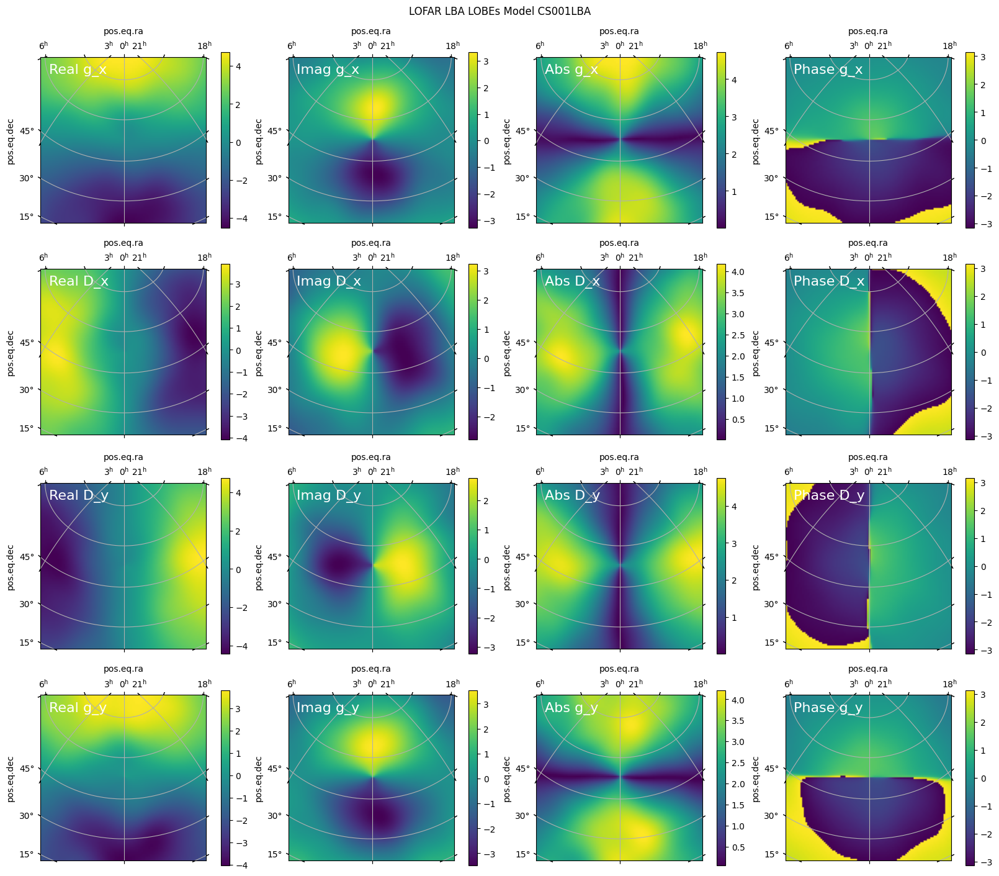

In [11]:
lobes_telescope = eb.load_telescope(ms_path, element_response_model='lobes')

lobes_jones = np.zeros((itrs_xyz.shape[0], 2, 2), dtype=np.complex64)

for xyz_idx in range(itrs_xyz.shape[0]):
    lobes_jones[xyz_idx, :, :] = lobes_telescope.element_response(
                                mjd_time_seconds,
                                station_id,
                                element_id,
                                frequency,
                                direction[xyz_idx, :],
                                is_local,
                                rotate=rotate,
                            )
    
lobes_gx = lobes_jones[:, 0, 0]
lobes_Dx = lobes_jones[:, 0, 1]
lobes_Dy = lobes_jones[:, 1, 0]
lobes_gy = lobes_jones[:, 1, 1]

lobes_gx.shape = (nside, nside)
lobes_Dx.shape = (nside, nside)
lobes_Dy.shape = (nside, nside)
lobes_gy.shape = (nside, nside)

plot_jones_on_sky(lobes_gx, lobes_Dx, lobes_Dy, lobes_gy, wcs, title=f"LOFAR LBA LOBEs Model {lobes_telescope.station_name(station_id)}")

As an aside, you'll always see errors like this:

```Creating LOBESElementResponse for station CS017LBA failed because: 
Coefficients file /home/jack-line/software/WODEN_dev/woden_dev/share/everybeam/lobes/LOBES_CS017LBA.h5 does not exist.
Switching to HamakerElementResponse instead. Further warnings of this type will be suppressed.
```

even if you don't ask for station `CS017LBA`. This is because `EveryBeam` loads up the model for EVERY station in the measurement set upon initialisation. I think it's fairly cheap so makes sense to do, just be aware of what this error message means.

We have what looks like a perturbed dipole pattern which is exactly what we should expect from a model including mutual coupling. HOWEVER, this dipole is aligned with the RA,Dec, not offset by 45 degrees. I set `is_local` argument to False running these beams and I believe it makes `EveryBeam` read the x,y,z coords as centred at the array centre, rather than earth centred. However, let's try toggling that flag for both models and see what happens:

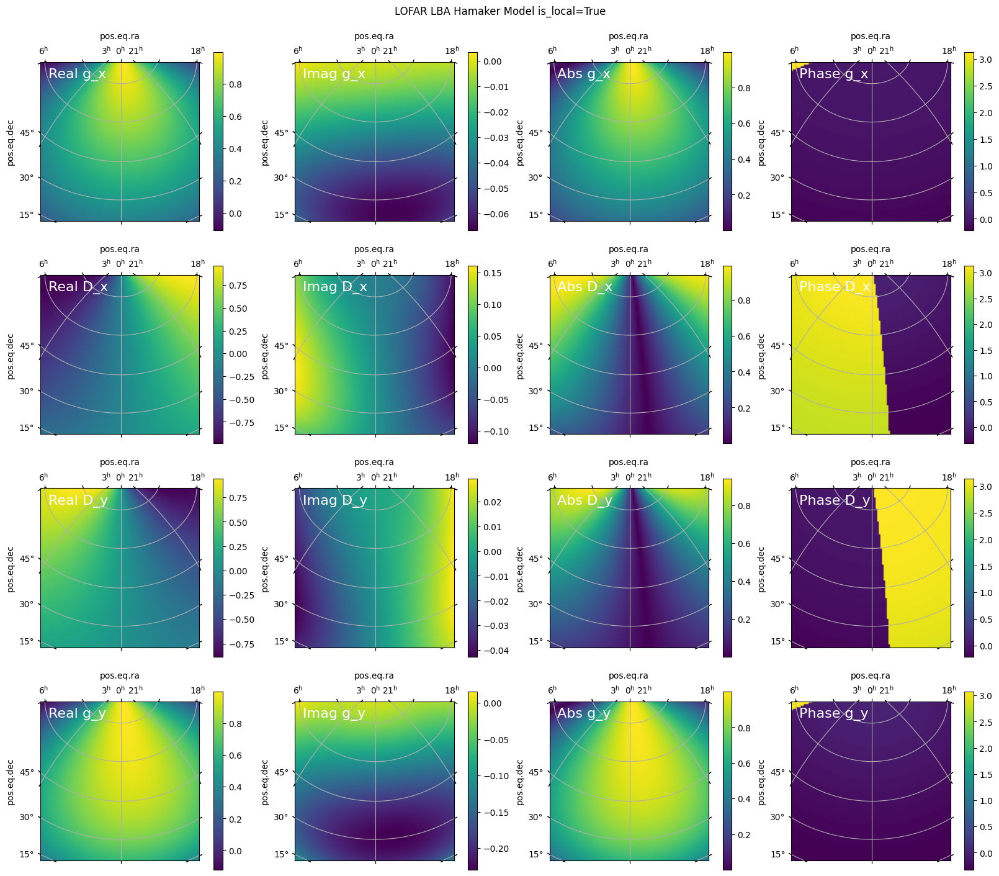

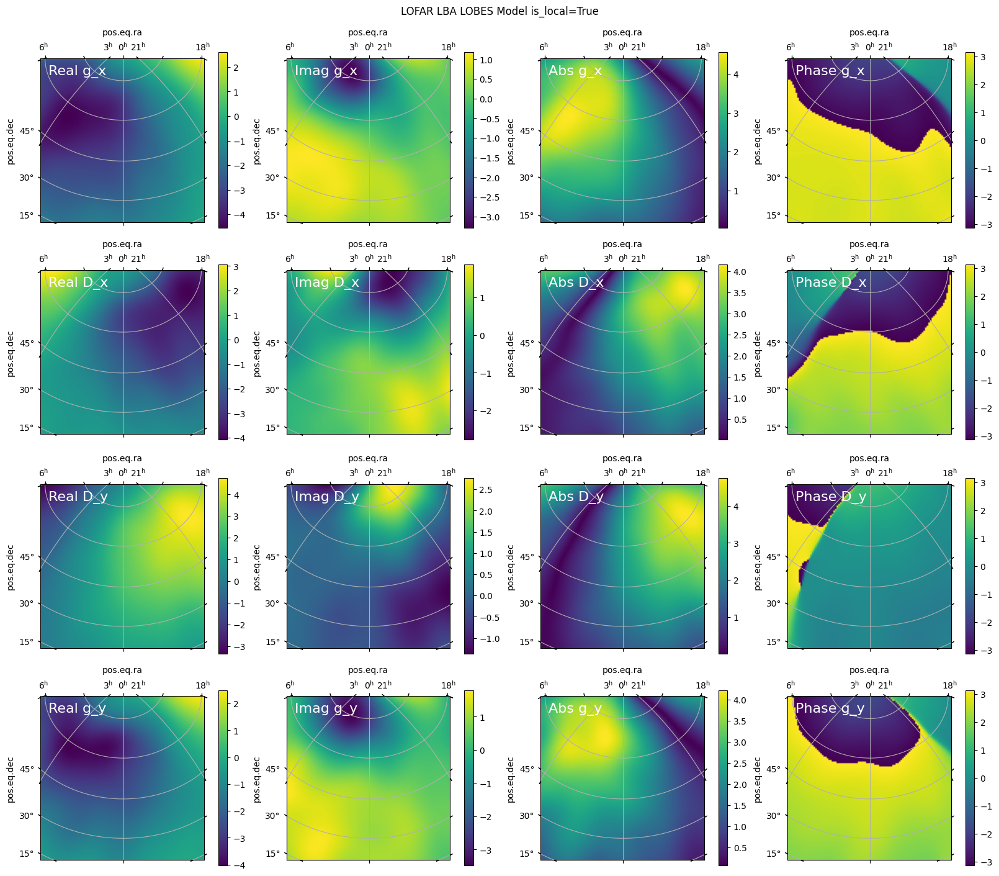

In [12]:
for telescope, model in zip([hamaker_telescope, lobes_telescope], ['Hamaker', 'LOBES']):
    is_local = True
    jones = np.zeros((itrs_xyz.shape[0], 2, 2), dtype=np.complex64)
    for xyz_idx in range(itrs_xyz.shape[0]):
        jones[xyz_idx, :, :] = telescope.element_response(
                                    mjd_time_seconds,
                                    station_id,
                                    element_id,
                                    frequency,
                                    direction[xyz_idx, :],
                                    is_local,
                                    rotate=False,
                                )
    
    gx = jones[:, 0, 0]
    Dx = jones[:, 0, 1]
    Dy = jones[:, 1, 0]
    gy = jones[:, 1, 1]

    gx.shape = (nside, nside)
    Dx.shape = (nside, nside)
    Dy.shape = (nside, nside)
    gy.shape = (nside, nside)

    plot_jones_on_sky(gx, Dx, Dy, gy, wcs, title=f"LOFAR LBA {model} Model is_local={is_local}")

OK. So this sticks the dipole origin essentially to a Dec of 90 degrees I think(?). Either way, you can see the nulls of the two beam patterns are still 45 degrees offset from each other. This means we can't just call the LOBEs and Hamaker models with the same `EveryBeam` command, and have them both in the same rotation.

Which means we need to rotate the LOBES model by 45 degrees to line it up with the Hamaker model. I think this is just needs to be an azimuthal rotation of the dipoles in the station frame. I'll make a toy version here to do it on the EveryBeam python interface outputs; we'll show later in the notebook the under-the-hood `WODEN` implementation gives the same result.

As the parallactic angle is locked to the celestial frame, I think you have to do this azmiuthal 45 rotation *before* you rotate by parallactic angle. Which means we can't rely on `EveryBeam` to do the parallactic angle rotation for us.

However, before we commit to that, let's look at the station beam models and see whether they are also offset by 45 degrees. 

[0.59527153 0.07483311 0.80003238]


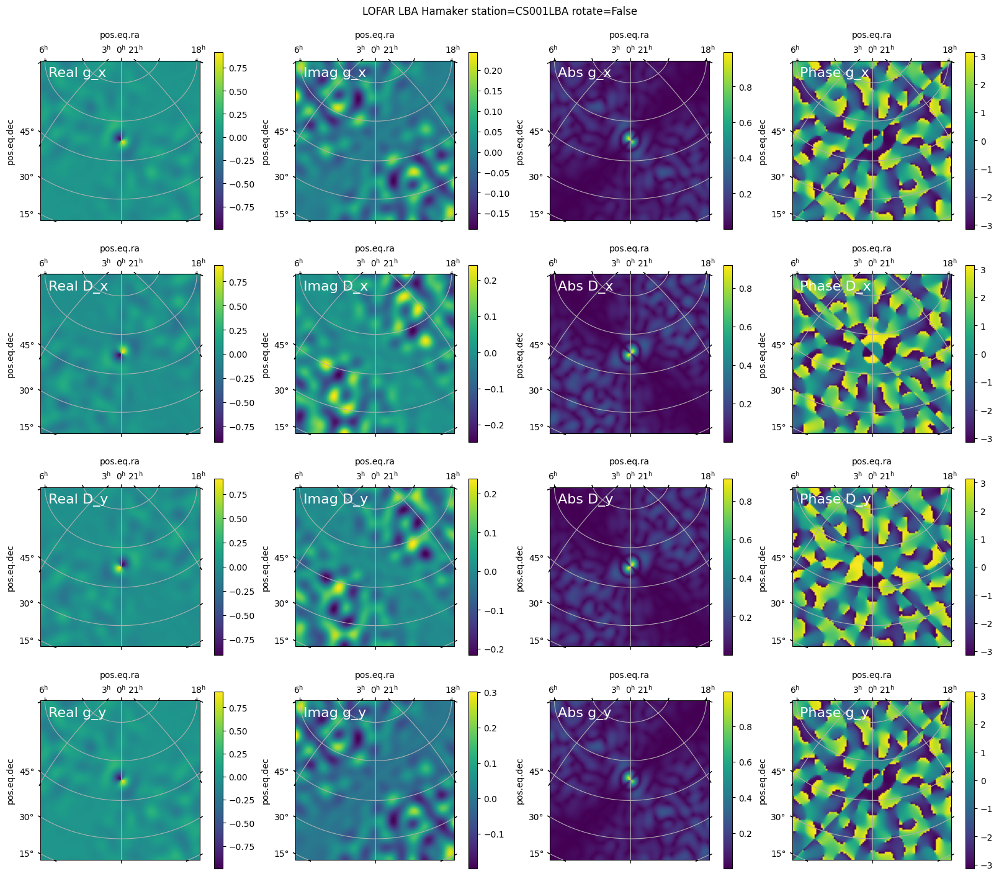

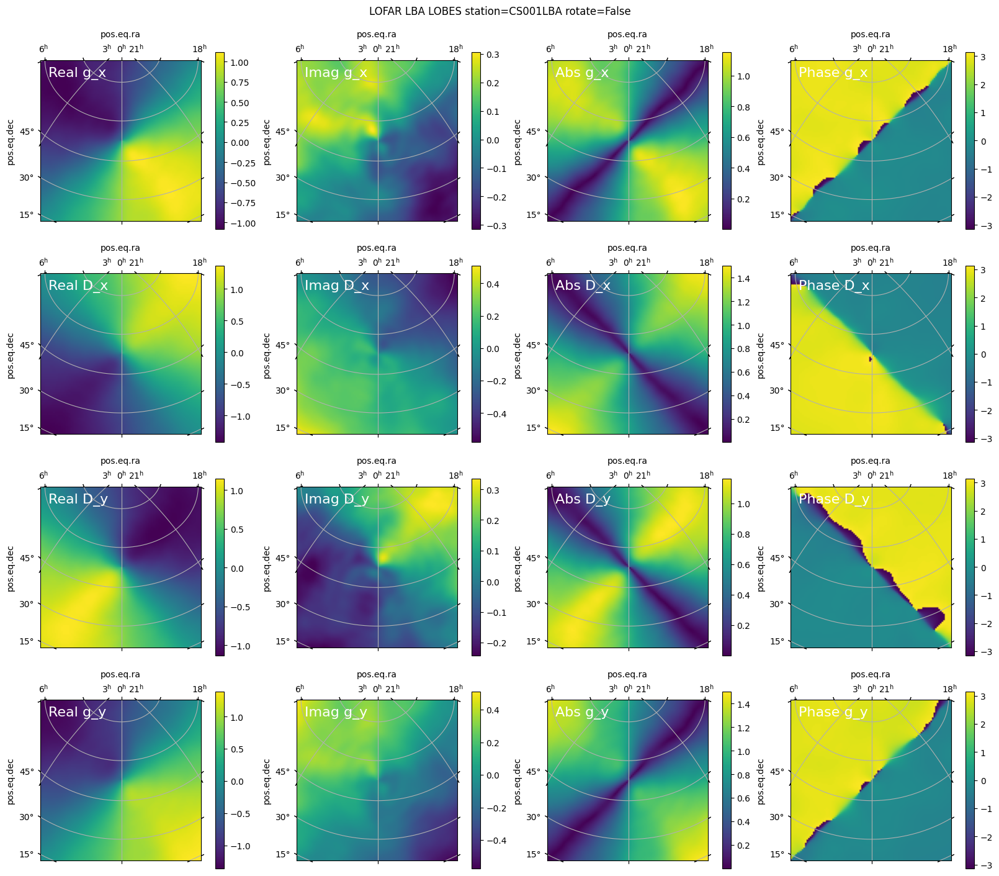

In [13]:
beam_centre = radec_to_xyz(np.radians(ra0)*u.rad, np.radians(dec0)*u.rad, mjd_time_seconds)
print(beam_centre)

rotate=False
station_id=0

# for telescope, model in zip([hamaker_telescope], ['Hamaker']):
for telescope, model in zip([hamaker_telescope, lobes_telescope], ['Hamaker', 'LOBES']):
    jones = np.zeros((itrs_xyz.shape[0], 2, 2), dtype=np.complex64)
    for xyz_idx in range(itrs_xyz.shape[0]):
        jones[xyz_idx, :, :] = telescope.station_response(
                                    mjd_time_seconds,
                                    station_id,
                                    frequency,
                                    direction[xyz_idx, :],
                                    beam_centre,
                                    rotate=rotate,
                                )
    
    gx = jones[:, 0, 0]
    Dx = jones[:, 0, 1]
    Dy = jones[:, 1, 0]
    gy = jones[:, 1, 1]

    gx.shape = (nside, nside)
    Dx.shape = (nside, nside)
    Dy.shape = (nside, nside)
    gy.shape = (nside, nside)

    plot_jones_on_sky(gx, Dx, Dy, gy, wcs, title=f"LOFAR LBA {model} station={lobes_telescope.station_name(station_id)} rotate={rotate}")

HUH? This LOBES station beam just looks like a sum over all the perturbed dipoles. It doesn't look like it's been beam-formed. HOWEVER, it is magically 45 degrees relative to north-south. What happens if we put parallactic rotation on?

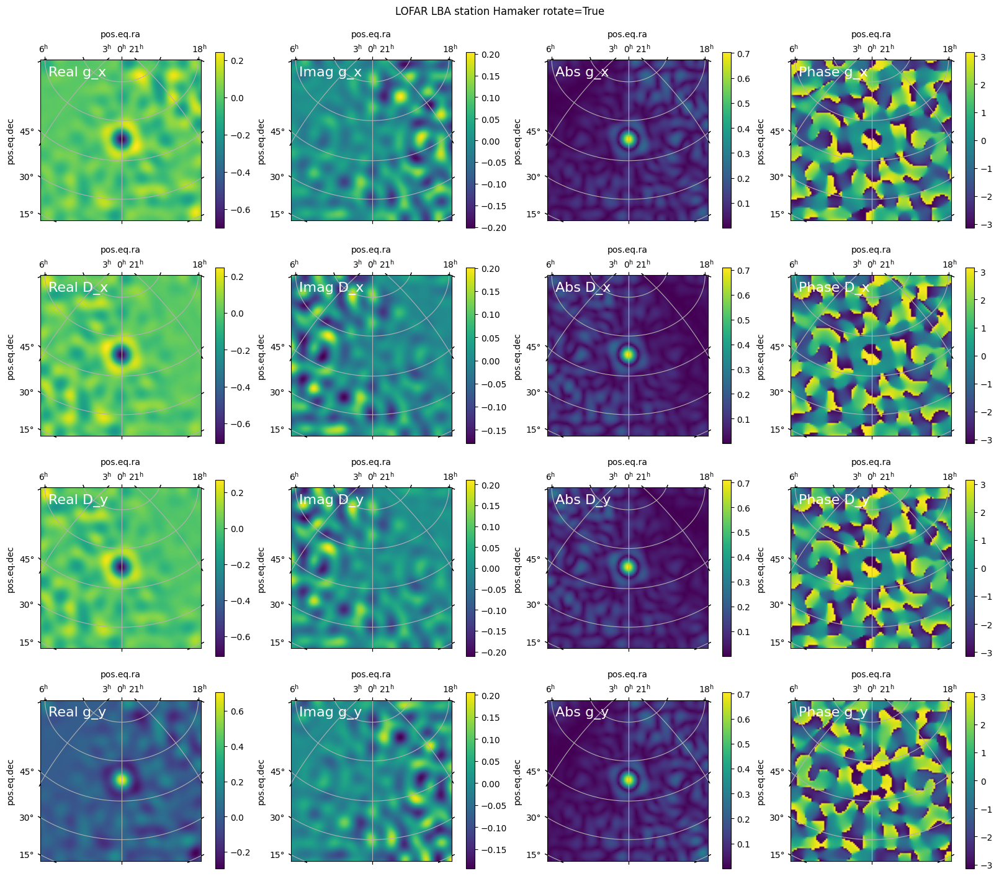

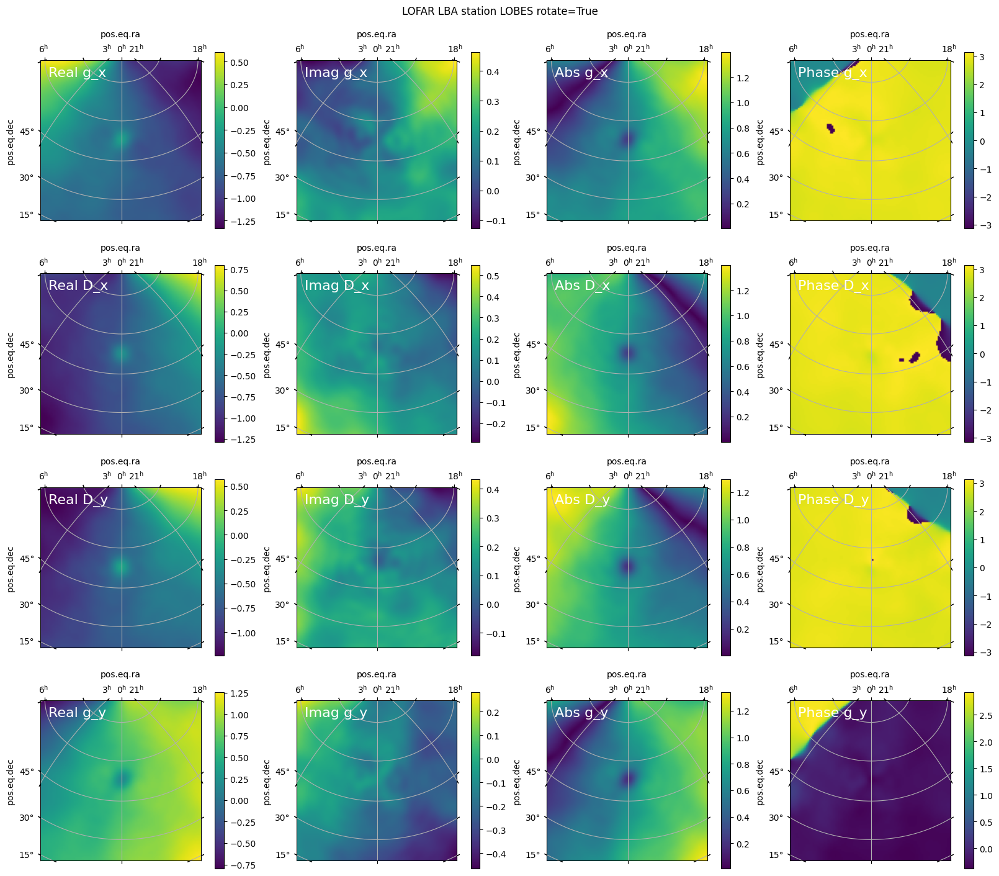

In [14]:
rotate=True
station_id=1

# for telescope, model in zip([hamaker_telescope], ['Hamaker']):
for telescope, model in zip([hamaker_telescope, lobes_telescope], ['Hamaker', 'LOBES']):
    jones = np.zeros((itrs_xyz.shape[0], 2, 2), dtype=np.complex64)
    for xyz_idx in range(itrs_xyz.shape[0]):
        jones[xyz_idx, :, :] = telescope.station_response(
                                    mjd_time_seconds,
                                    station_id,
                                    frequency,
                                    direction[xyz_idx, :],
                                    beam_centre,
                                    rotate=rotate,
                                )
    
    gx = jones[:, 0, 0]
    Dx = jones[:, 0, 1]
    Dy = jones[:, 1, 0]
    gy = jones[:, 1, 1]

    gx.shape = (nside, nside)
    Dx.shape = (nside, nside)
    Dy.shape = (nside, nside)
    gy.shape = (nside, nside)

    plot_jones_on_sky(gx, Dx, Dy, gy, wcs, title=f"LOFAR LBA station {model} rotate={rotate}")

## Summary and suggestions
My main conclusions from this are:
 - The single dipole plots between Hamaker and LOBES models seem to be offset by 45 degrees.
 - The station beams don't seem to have the array factor in for LOBES
 - There isn't a LOBES model for every station. So we must find a way to make things consistent between Hamaker and LOBES models if we want to use LOBES for a full LOFAR simulation.

My suggestions are if you need LOBES, talk to the EveryBeam developers. Show some of this work and see whether JLBLine has just misunderstood things, or if there are genuine bugs here.